In [1]:
import warnings
warnings.simplefilter("ignore", UserWarning)

import scanpy as sc
import pandas as pd
import numpy as np
import anndata
import os
from progressbar import progressbar

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

from scipy.stats import pearsonr

In [2]:
import milopy.core as milo
import milopy.plot as milopl
import milopy.utils

In [3]:
import session_info
session_info.show()

In [4]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/nfs/team205/kk18/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

In [5]:
sc.settings.set_figure_params(dpi=80)

# Functions

In [6]:
from scipy.stats import entropy
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

def calculate_entropy(df1, df2, relative_to_max=True):
    """
    Calculate the entropy-based diffusion scores for each group defined in df1 and apply it in df2.

    Parameters:
    - df1: DataFrame representing cell-by-cluster matrix for defining groups.
    - df2: DataFrame representing cell-by-cluster matrix for calculating entropy.

    Returns:
    A dictionary with group names as keys and their entropy scores as values.
    """
    scores = {}
    for group_name in progressbar(df1.columns):
        # Identify cells belonging to the current group
        group_indices = df1.index[df1[group_name] == 1].tolist()
        # Subset df2 for the current group
        group_df2 = df2.loc[group_indices]
        # Calculate the distribution of cells across clusters in df2
        cluster_distribution = group_df2.sum(axis=0) / group_df2.sum(axis=0).sum()
        # Calculate entropy for the group
        if relative_to_max:
            # Prepare maximum distribution
            # Create a DataFrame filled with zeros
            max_distr_df = pd.DataFrame(0, index=group_df2.index, columns=group_df2.columns)
            # Replace elements with 1
            col_indices = [i % max_distr_df.shape[1] for i in range(len(group_indices))]
            max_distr_df.values[range(len(group_indices)), col_indices] = 1
            # display(max_distr_df)
            # Calculate disctribution
            max_distribution = max_distr_df.sum(axis=0) / max_distr_df.sum(axis=0).sum()
            # print(max_distribution)
            scores[group_name] = entropy(pk=cluster_distribution,
                                         qk=max_distribution,
                                        )
        else:
            scores[group_name] = entropy(pk=cluster_distribution)

    return scores



def calculate_kl_divergence(df1, df2):
    """
    Calculate the Kullback-Leibler divergence for each group defined in df1 and apply it in df2.

    Parameters:
    - df1: DataFrame representing cell-by-cluster matrix for defining groups.
    - df2: DataFrame representing cell-by-cluster matrix for calculating KL divergence.

    Returns:
    A dictionary with group names as keys and their KL divergence as values.
    """
    scores = {}
    num_clusters = df2.shape[1]
    uniform_distribution = np.ones(num_clusters) / num_clusters

    for group_name in df1.columns:
        # Identify cells belonging to the current group
        group_indices = df1.index[df1[group_name] == 1].tolist()
        # Subset df2 for the current group
        group_df2 = df2.loc[group_indices]
        # Calculate the distribution of cells across clusters in df2
        cluster_distribution = group_df2.sum(axis=0) / group_df2.sum(axis=0).sum()
        # Calculate KL divergence for the group
        scores[group_name] = entropy(cluster_distribution, uniform_distribution)

    return scores

def model_entropy(y, x:list, degree=2):
    """
    Fit a trend to the nhood-wise entropy against the data size.

    Parameters:
    y (array-like): Numeric vector of dependent variable 
    x (list): list of numeric vector of independent variables (regressor)
    degree (int, optional): The degree of polynomials to be used in the loess fit.

    Returns:
    dict: A dictionary containing the fitted values and the model.
    """

    # Preparing the data for fitting
    X_list = []
    for xx in x:
        X_list.append(np.array(xx))
    Y = np.array(y)
    
    # Combine X1 and X2 into a single feature matrix
    if len(X_list)>1:
        X = np.column_stack(X_list)
    else:
        X = X_list[0]

    # Creating a polynomial regression model
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    model.fit(X, Y)

    # Predicting the fitted values
    fitted_values = model.predict(X)

    return {"fitted_values": fitted_values, "model": model}

# Parameters

In [7]:
# dir_to_adata_peakvi = '/nfs/team205/heart/anndata_objects/Foetal/multiome_ATAC/ArchR/project_output/PeakMatrix/mid_grain_mod'
path_to_gex_milo_nhoods = '/nfs/team205/heart/anndata_objects/Foetal/multiome_ATAC/ArchR/project_output/Milo_nhoods_gex/scVI_mid_grain_mod'
path_to_atac_milo_nhoods = '/nfs/team205/heart/anndata_objects/Foetal/multiome_ATAC/ArchR/project_output/Milo_nhoods/mid_grain_mod'
path_to_adata_gex = '/nfs/team205/heart/anndata_objects/Foetal/Feb28ObjectRaw_Multiome.h5ad'
celltype_col = 'mid_grain_mod'

In [8]:
figdir = '/nfs/team205/heart/fetal_ms_figures/raw_plots_kk'

In [9]:
# order of mid grain (mod) cell types
celltypes = [
    'AtrialCardiomyocytes_plusCCS',
    'VentricularCardiomyocytes_plusCCS',
    'Fibroblasts',
    'MuralCells',
    'PericardialCells', 
    'EpicardialCells',
    'BloodVesselEndothelialCells',
    'EndocardialCells', 
     'Neurons',
    'Glia', 
     'MyeloidCells',
    'LymphoidCells',   
             ]

# Read in RNA Milo nhoods data

In [11]:
# nhood results
prefix = 'one-layer_added-cov-region_subsampled-n1000_'
suffix = '_milo_nhoods_result.csv'

rna_nhoods_res = {}
for file in os.listdir(path_to_gex_milo_nhoods):
    if (prefix in file)&(suffix in file):
        celltype = file.replace(prefix,'').replace(suffix,'')
        print(celltype)
        rna_nhoods_res[celltype] = pd.read_csv(f'{path_to_gex_milo_nhoods}/{prefix}{celltype}{suffix}',
                                           index_col=0
                                          )
        # rename nhood names
        rna_nhoods_res[celltype].index = celltype+'_'+rna_nhoods_res[celltype].index.astype('str')
rna_nhoods_res[celltype].head(n=3)

LymphoidCells
LymphaticEndothelialCells
EndocardialCells
AtrialCardiomyocytes_plusCCS
MuralCells
Neurons
VentricularCardiomyocytes_plusCCS
Fibroblasts
EpicardialCells
MyeloidCells
BloodVesselEndothelialCells
Glia
PericardialCells


,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR,Nhood_size,enrichment,cells,variance_scVI-latent
nhood,,,,,,,,,,,,
PericardialCells_nhood_1,BHF_F_Hea13168896_BHF_F_Hea13168512_CTGCAATAGG...,4.584104,0.417752,16.370048,7.776075,0.005538,0.013495,0.013072,34.0,old,BHF_F_Hea13168894_BHF_F_Hea13168510_TTGACATCAA...,0.518378
PericardialCells_nhood_2,BHF_F_Hea13168894_BHF_F_Hea13168510_GAGTAACCAG...,3.700712,0.153671,17.174902,0.831109,0.362481,0.449044,0.449912,84.0,nonsignificant,BHF_F_Hea13168894_BHF_F_Hea13168510_TATTAGCCAA...,0.375706
PericardialCells_nhood_3,BHF_F_Hea13168894_BHF_F_Hea13168510_GGGTGTTGTT...,3.395411,0.205966,16.972782,1.828992,0.176983,0.267084,0.263469,73.0,nonsignificant,BHF_F_Hea13168894_BHF_F_Hea13168510_TACCTCATCC...,0.366588


In [12]:
prefix = 'one-layer_added-cov-region_subsampled-n1000_'
suffix = '_milo_cell-by-nhood.csv'

rna_cell_by_nhood_dfs = {}
for file in os.listdir(path_to_gex_milo_nhoods):
    if (prefix in file)&(suffix in file):
        celltype = file.replace(prefix,'').replace(suffix,'')
        print(celltype)
        rna_cell_by_nhood_dfs[celltype] = pd.read_csv(f'{path_to_gex_milo_nhoods}/{prefix}{celltype}{suffix}',
                                           index_col=0
                                          )
        # rename nhood names
        rna_cell_by_nhood_dfs[celltype].columns = celltype+'_'+rna_cell_by_nhood_dfs[celltype].columns.astype('str')
rna_cell_by_nhood_dfs[celltype].head(n=3)

VentricularCardiomyocytes_plusCCS
AtrialCardiomyocytes_plusCCS
MyeloidCells
PericardialCells
LymphoidCells
BloodVesselEndothelialCells
LymphaticEndothelialCells
Neurons
MuralCells
EpicardialCells
Glia
EndocardialCells
Fibroblasts


,Fibroblasts_nhood_1,Fibroblasts_nhood_2,Fibroblasts_nhood_3,Fibroblasts_nhood_4,Fibroblasts_nhood_5,Fibroblasts_nhood_6,Fibroblasts_nhood_7,Fibroblasts_nhood_8,Fibroblasts_nhood_9,Fibroblasts_nhood_10,...,Fibroblasts_nhood_291,Fibroblasts_nhood_292,Fibroblasts_nhood_293,Fibroblasts_nhood_294,Fibroblasts_nhood_295,Fibroblasts_nhood_296,Fibroblasts_nhood_297,Fibroblasts_nhood_298,Fibroblasts_nhood_299,Fibroblasts_nhood_300
barcode,,,,,,,,,,,,,,,,,,,,,
7089STDY13216921_BHF_F_Hea13242528_CGTCAATAGAGAGGAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7089STDY13216921_BHF_F_Hea13242528_TAGAGCCGTGTTGTGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7089STDY13216921_BHF_F_Hea13242528_TCCATCATCCGTAAAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Read in ATAC Milo nhoods data

In [13]:
midfix = '_added-cov-region_subsampled-n1000'
suffix = '_milo_cell-by-nhood.csv'

atac_cell_by_nhood_dfs = {}
for file in os.listdir(path_to_atac_milo_nhoods):
    if (midfix in file)&(suffix in file):
        celltype = file.replace(midfix,'').replace(suffix,'')
        print(celltype)
        atac_cell_by_nhood_dfs[celltype] = pd.read_csv(f'{path_to_atac_milo_nhoods}/{celltype}{midfix}{suffix}',
                                           index_col=0
                                          )
        # rename nhood names
        atac_cell_by_nhood_dfs[celltype].columns = 'ATAC_'+celltype+'_'+atac_cell_by_nhood_dfs[celltype].columns.astype('str')

atac_cell_by_nhood_dfs[celltype].head(n=3)

PericardialCells
Glia
BloodVesselEndothelialCells
AtrialCardiomyocytes_plusCCS
MuralCells
VentricularCardiomyocytes_plusCCS
Neurons
Fibroblasts
EpicardialCells
MyeloidCells
LymphoidCells
EndocardialCells
LymphaticEndothelialCells


,ATAC_LymphaticEndothelialCells_nhood_1,ATAC_LymphaticEndothelialCells_nhood_2,ATAC_LymphaticEndothelialCells_nhood_3,ATAC_LymphaticEndothelialCells_nhood_4,ATAC_LymphaticEndothelialCells_nhood_5,ATAC_LymphaticEndothelialCells_nhood_6,ATAC_LymphaticEndothelialCells_nhood_7,ATAC_LymphaticEndothelialCells_nhood_8,ATAC_LymphaticEndothelialCells_nhood_9,ATAC_LymphaticEndothelialCells_nhood_10,...,ATAC_LymphaticEndothelialCells_nhood_23,ATAC_LymphaticEndothelialCells_nhood_24,ATAC_LymphaticEndothelialCells_nhood_25,ATAC_LymphaticEndothelialCells_nhood_26,ATAC_LymphaticEndothelialCells_nhood_27,ATAC_LymphaticEndothelialCells_nhood_28,ATAC_LymphaticEndothelialCells_nhood_29,ATAC_LymphaticEndothelialCells_nhood_30,ATAC_LymphaticEndothelialCells_nhood_31,ATAC_LymphaticEndothelialCells_nhood_32
7089STDY13216921_BHF_F_Hea13242528_TGGGCCTAGATGGACA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
7089STDY13216921_BHF_F_Hea13242528_TAACCGGTCTCCATGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
7089STDY13216921_BHF_F_Hea13242528_TTGTGTGCAGGCATCT-1,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0


# Entropy of the diffusion of each RNA nhood in ATAC space

In [12]:
# for each celltype
for i,celltype in enumerate(celltypes):
    # entropy score
    res = calculate_entropy(df1 = rna_cell_by_nhood_dfs[celltype], 
                            df2 = atac_cell_by_nhood_dfs[celltype],
                            relative_to_max=False
                                                             )
    # add to nhood result dataframe
    rna_nhoods_res[celltype].loc[res.keys(),'entropy score'] = list(res.values())
    # checkign whether there's nan
    if rna_nhoods_res[celltype]['entropy score'].isna().sum()>0:
        print(f'{celltype} has nan in the result')

rna_nhoods_res[celltype].head(n=3)

100% (195 of 195) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (300 of 300) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (300 of 300) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (118 of 118) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (83 of 83) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (65 of 65) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (138 of 138) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (65 of 65) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (50 of 50) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (80 of 80) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (161 of 161) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (284 of 284) |######################| Elapsed Time: 0:00:00 Time:  0:00:00


,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR,Nhood_size,enrichment,cells,variance_scVI-latent,entropy score
nhood,,,,,,,,,,,,,
LymphoidCells_nhood_1,7089STDY13216921_BHF_F_Hea13242528_TTTCACCCACT...,3.499130,0.388010,14.260352,17.159004,0.003278,0.007958,0.007867,28.0,old,7089STDY13216920_BHF_F_Hea13242527_AGCTAACTCCT...,0.248547,4.663061
LymphoidCells_nhood_2,7089STDY13216921_BHF_F_Hea13242528_TGCTAACAGTT...,3.371738,0.674413,15.236231,6.426622,0.153392,0.166272,0.166032,46.0,nonsignificant,7089STDY13216921_BHF_F_Hea13242528_CAATGTGGTTT...,0.250114,4.729482
LymphoidCells_nhood_3,7089STDY13216921_BHF_F_Hea13242528_TTATCCTAGCT...,3.104294,0.618961,15.057391,9.408805,0.002189,0.006475,0.006419,95.0,old,7089STDY13216921_BHF_F_Hea13242528_CAACCCTTCCG...,0.232534,4.643489


# Model entropy

Regressors</r>
* nhood size
* nhood cell variance in scVI latent space

In [15]:
for celltype in celltypes:
    nhood_sizes = np.array(rna_nhoods_res[celltype]['Nhood_size'])
    variances = np.array(rna_nhoods_res[celltype]['variance_scVI-latent'])
    entropy_scores = np.array(rna_nhoods_res[celltype]['entropy score'])
    fitted_values = model_entropy(y=entropy_scores, x=[nhood_sizes,variances], degree=1)['fitted_values']
    residuals = entropy_scores - fitted_values
    # add to the dataframe
    rna_nhoods_res[celltype]['entropy score, fitted'] = fitted_values.copy()
    rna_nhoods_res[celltype]['entropy score, residual'] = residuals.copy()

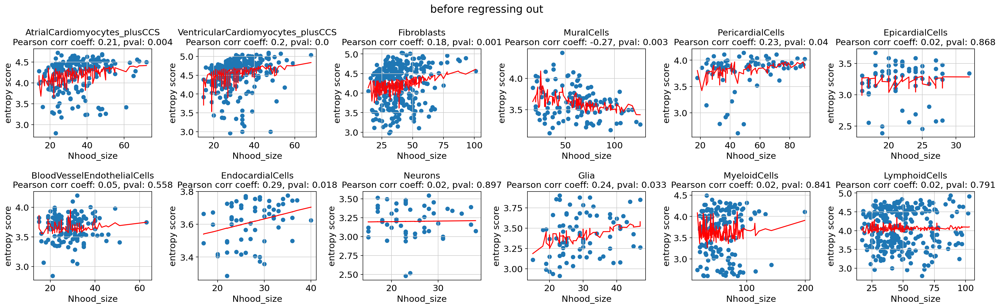

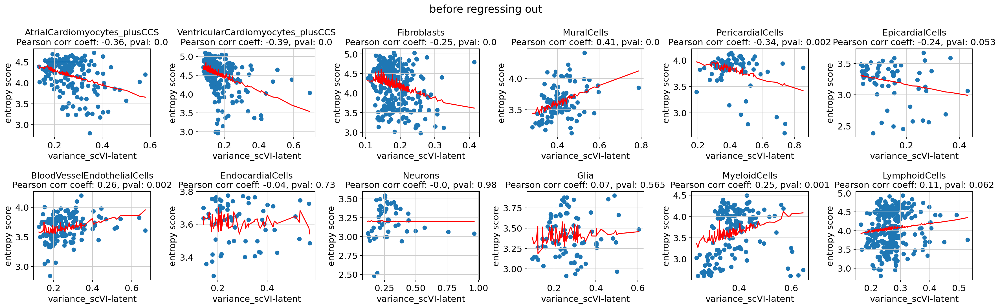

In [16]:
# Plotting original value with fitted line
# prepare figure
nrows = 2
ncols = 6
fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=(22,7)) 
for i,celltype in enumerate(celltypes):
    df = rna_nhoods_res[celltype]
    corr_res = pearsonr(df['Nhood_size'],df['entropy score'])
    axs[i//ncols,i%ncols].scatter(x=df['Nhood_size'],y=df['entropy score'])
    # Sort the sizes array and reorder the fitted values accordingly
    sorted_indices = np.argsort(df['Nhood_size'])
    sorted_sizes = np.array(df['Nhood_size'])[sorted_indices]
    sorted_fitted_values = df['entropy score, fitted'][sorted_indices]
    axs[i//ncols,i%ncols].plot(sorted_sizes,sorted_fitted_values,color='red')
    axs[i//ncols,i%ncols].set_title(f'{celltype}\nPearson corr coeff: {round(corr_res[0],2)}, pval: {round(corr_res[1],3)}')
    axs[i//ncols,i%ncols].set_xlabel('Nhood_size')
    axs[i//ncols,i%ncols].set_ylabel('entropy score')
fig.suptitle('before regressing out')
fig.tight_layout()

fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=(22,7)) 
for i,celltype in enumerate(celltypes):
    df = rna_nhoods_res[celltype]
    corr_res = pearsonr(df['variance_scVI-latent'],df['entropy score'])
    axs[i//ncols,i%ncols].scatter(x=df['variance_scVI-latent'],y=df['entropy score'])
    # Sort the sizes array and reorder the fitted values accordingly
    sorted_indices = np.argsort(df['variance_scVI-latent'])
    sorted_sizes = np.array(df['variance_scVI-latent'])[sorted_indices]
    sorted_fitted_values = df['entropy score, fitted'][sorted_indices]
    axs[i//ncols,i%ncols].plot(sorted_sizes,sorted_fitted_values,color='red')
    axs[i//ncols,i%ncols].set_title(f'{celltype}\nPearson corr coeff: {round(corr_res[0],2)}, pval: {round(corr_res[1],3)}')
    axs[i//ncols,i%ncols].set_xlabel('variance_scVI-latent')
    axs[i//ncols,i%ncols].set_ylabel('entropy score')
fig.suptitle('before regressing out')
fig.tight_layout()

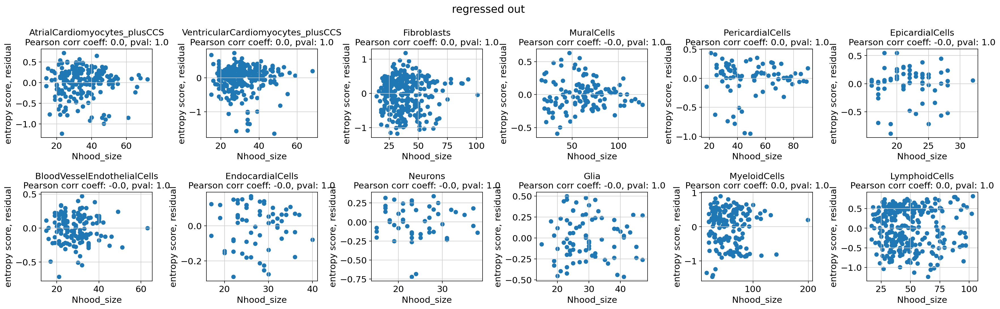

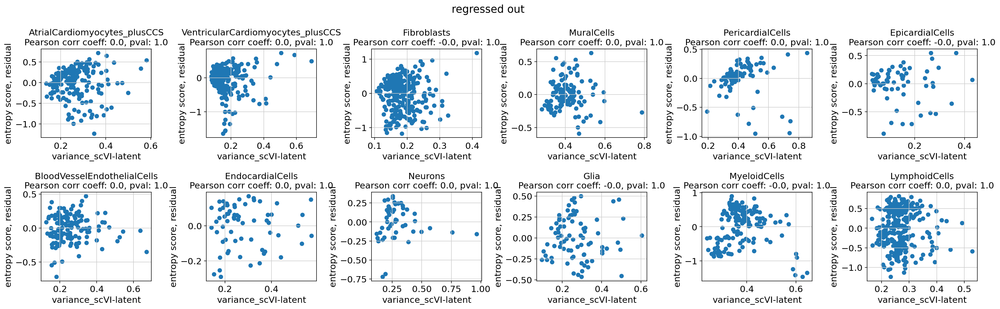

In [17]:
# Plot after correction

# prepare figure
nrows = 2
ncols = 6
fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=(22,7)) 
for i,celltype in enumerate(celltypes):
    df = rna_nhoods_res[celltype]
    corr_res = pearsonr(df['Nhood_size'],df['entropy score, residual'])
    axs[i//ncols,i%ncols].scatter(x=df['Nhood_size'],y=df['entropy score, residual'])
    axs[i//ncols,i%ncols].set_title(f'{celltype}\nPearson corr coeff: {round(corr_res[0],2)}, pval: {round(corr_res[1],4)}')
    axs[i//ncols,i%ncols].set_xlabel('Nhood_size')
    axs[i//ncols,i%ncols].set_ylabel('entropy score, residual')
fig.suptitle('regressed out')
fig.tight_layout()

fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=(22,7)) 
for i,celltype in enumerate(celltypes):
    df = rna_nhoods_res[celltype]
    corr_res = pearsonr(df['variance_scVI-latent'],df['entropy score, residual'])
    axs[i//ncols,i%ncols].scatter(x=df['variance_scVI-latent'],y=df['entropy score, residual'])
    axs[i//ncols,i%ncols].set_title(f'{celltype}\nPearson corr coeff: {round(corr_res[0],2)}, pval: {round(corr_res[1],4)}')
    axs[i//ncols,i%ncols].set_xlabel('variance_scVI-latent')
    axs[i//ncols,i%ncols].set_ylabel('entropy score, residual')
fig.suptitle('regressed out')
fig.tight_layout()

# Assign fine-grained celltype to each nhood

* for nhoods which have a purity more than a threshold (pure nhoods), the maximum cell type will be assigned
* select/note cells which are actually the cells as assigned

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR,Nhood_size,enrichment,...,assigned_sex,purity_sex,assigned_cycling,purity_cycling,assigned_region,purity_region,cells_of_assigned_celltype,Nhood_size_sel,assigned_fine_grain,purity_fine_grain
nhood,,,,,,,,,,,,,,,,,,,,,
LymphoidCells_nhood_1,7089STDY13216921_BHF_F_Hea13242528_TTTCACCCACT...,3.499130,0.388010,14.260352,17.159004,0.003278,0.007958,0.007867,28.0,old,...,male,0.964286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LymphoidCells_nhood_2,7089STDY13216921_BHF_F_Hea13242528_TGCTAACAGTT...,3.371738,0.674413,15.236231,6.426622,0.153392,0.166272,0.166032,46.0,nonsignificant,...,NaN,NaN,no,0.804348,NaN,NaN,NaN,NaN,NaN,NaN
LymphoidCells_nhood_3,7089STDY13216921_BHF_F_Hea13242528_TTATCCTAGCT...,3.104294,0.618961,15.057391,9.408805,0.002189,0.006475,0.006419,95.0,old,...,male,0.957895,NaN,NaN,NaN,NaN,BHF_F_Hea13168897_BHF_F_Hea13168513_TCAAGACTCT...,83.0,TCellsCD4pos,0.873684


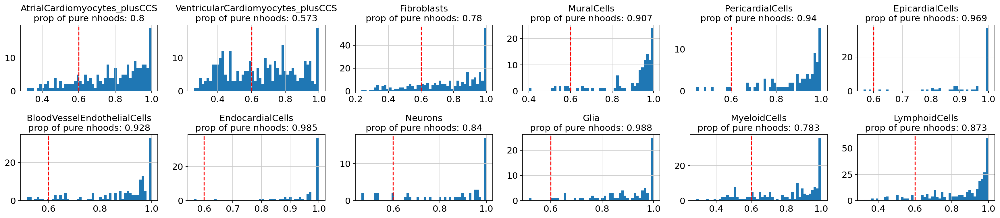

In [19]:
purity_thresh = 0.6

# read in celltype info
ad = sc.read_h5ad(path_to_adata_gex,backed='r')
obs = ad.obs.copy()

# prepare figure
nrows = 2
ncols = 6
fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=(22,5)) 

rna_cell_by_nhood_dfs_sel = {}
# assign
for i,celltype in enumerate(celltypes):
    df = rna_cell_by_nhood_dfs[celltype].copy()
    # get cell number of each cell type in each nhood
    df.index = obs['fine_grain'].astype('str').reindex(df.index)
    df = df.reset_index().groupby('fine_grain').sum()
    # purity (proportion of the largest cell type)
    purity_arr = df.max(0)/df.sum(0)
    # get pure nhood
    pure_nhoods = list(purity_arr.index[purity_arr>purity_thresh])
    axs[i//ncols,i%ncols].hist(purity_arr,bins=50)
    axs[i//ncols,i%ncols].axvline(x=purity_thresh, color='red', linestyle='--', linewidth=1.5)
    axs[i//ncols,i%ncols].set_title(f'{celltype}\nprop of pure nhoods: {round(len(pure_nhoods)/len(purity_arr),3)}')
    # assign celltype
    df_pure = df[pure_nhoods]
    mask = df_pure == df_pure.max(0)
    assigned_pre = mask.reset_index().melt(id_vars=['fine_grain']).rename(columns={'value':'assigned',
                                                                               'variable':'nhood',
                                                                               'fine_grain':'assigned_fine_grain'
                                                                              })
    assigned_pre['purity_fine_grain'] = list(purity_arr[assigned_pre['nhood']])
    assigned = assigned_pre[assigned_pre['assigned']]
    # get cells of the assigned_celltype
    rna_cell_by_nhood_dfs_sel[celltype] = pd.DataFrame(0,
                                                       columns=rna_cell_by_nhood_dfs[celltype].columns,
                                                       index=rna_cell_by_nhood_dfs[celltype].index)
    for ind in assigned.index:
        celltype_assigned = assigned.loc[ind,'assigned_fine_grain']
        nh = assigned.loc[ind,'nhood']
        nh_cells = list(rna_cell_by_nhood_dfs[celltype].index[rna_cell_by_nhood_dfs[celltype][nh]==1])
        celltype_cells = list(obs.index[obs['fine_grain']==celltype_assigned])
        cells = list(set(nh_cells).intersection(celltype_cells))
        rna_cell_by_nhood_dfs_sel[celltype].loc[cells,nh] = 1
        rna_nhoods_res[celltype].loc[nh,'cells_of_assigned_celltype'] = ','.join(cells)
        rna_nhoods_res[celltype].loc[nh,'Nhood_size_sel'] = len(cells)
    
    # add to nhood result dataframe
    rna_nhoods_res[celltype].loc[assigned['nhood'],'assigned_fine_grain'] = list(assigned['assigned_fine_grain'])
    rna_nhoods_res[celltype].loc[assigned['nhood'],'purity_fine_grain'] = list(assigned['purity_fine_grain'])
    # sanity check
    if sum(rna_nhoods_res[celltype]['assigned_fine_grain'].isna()==False)/len(rna_nhoods_res[celltype])!=len(pure_nhoods)/len(purity_arr):
        print(f'{celltype}: something went wrong when adding to result dataframe')

fig.tight_layout()
rna_nhoods_res[celltype].head(n=3)

In [20]:
# just checking the calculations are consistent
sum(rna_nhoods_res[celltype]['Nhood_size_sel']/rna_nhoods_res[celltype]['Nhood_size'] == rna_nhoods_res[celltype]['purity_fine_grain'])

248

# Entropy of the diffusion of each RNA nhood in ATAC space (selected cells)

In [22]:
# for each celltype
for i,celltype in enumerate(celltypes):
    # entropy score
    res = calculate_entropy(df1 = rna_cell_by_nhood_dfs_sel[celltype], 
                            df2 = atac_cell_by_nhood_dfs[celltype],
                            relative_to_max=False
                                                             )
    # add to nhood result dataframe
    rna_nhoods_res[celltype].loc[res.keys(),'entropy score, selected cells'] = list(res.values())
    # checkign whether there's more nan than expected
    if rna_nhoods_res[celltype]['entropy score, selected cells'].isna().sum()>rna_nhoods_res[celltype]['assigned_fine_grain'].isna().sum():
        print(f'{celltype} has larger nan than expected')

rna_nhoods_res[celltype].head(n=3)

100% (195 of 195) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (300 of 300) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (300 of 300) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (118 of 118) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (83 of 83) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (65 of 65) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (138 of 138) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (65 of 65) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (50 of 50) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (80 of 80) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (161 of 161) |######################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (284 of 284) |######################| Elapsed Time: 0:00:00 Time:  0:00:00


,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR,Nhood_size,enrichment,...,purity_sex,assigned_cycling,purity_cycling,assigned_region,purity_region,cells_of_assigned_celltype,Nhood_size_sel,assigned_fine_grain,purity_fine_grain,"entropy score, selected cells"
nhood,,,,,,,,,,,,,,,,,,,,,
LymphoidCells_nhood_1,7089STDY13216921_BHF_F_Hea13242528_TTTCACCCACT...,3.499130,0.388010,14.260352,17.159004,0.003278,0.007958,0.007867,28.0,old,...,0.964286,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LymphoidCells_nhood_2,7089STDY13216921_BHF_F_Hea13242528_TGCTAACAGTT...,3.371738,0.674413,15.236231,6.426622,0.153392,0.166272,0.166032,46.0,nonsignificant,...,NaN,no,0.804348,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LymphoidCells_nhood_3,7089STDY13216921_BHF_F_Hea13242528_TTATCCTAGCT...,3.104294,0.618961,15.057391,9.408805,0.002189,0.006475,0.006419,95.0,old,...,0.957895,NaN,NaN,NaN,NaN,BHF_F_Hea13168897_BHF_F_Hea13168513_TCAAGACTCT...,83.0,TCellsCD4pos,0.873684,4.561025


In [23]:
# regress out the effect of Nhood_size
for celltype in celltypes:
    df_sel = rna_nhoods_res[celltype].dropna(subset='assigned_fine_grain')
    nhood_sizes = np.array(df_sel['Nhood_size'])
    variances = np.array(df_sel['variance_scVI-latent'])
    entropy_scores = np.array(df_sel['entropy score'])
    fitted_values = model_entropy(y=entropy_scores, x=[nhood_sizes,variances], degree=1)['fitted_values']
    residuals = entropy_scores - fitted_values
    df_out = pd.DataFrame({'nhood':df_sel.index,'fitted':fitted_values,'residual':residuals})
    df_out.set_index('nhood',inplace=True)
    # add to the dataframe
    rna_nhoods_res[celltype]['entropy score, selected cells, fitted'] = df_out['fitted'].reindex(rna_nhoods_res[celltype].index).copy()
    rna_nhoods_res[celltype]['entropy score, selected cells, residual'] = df_out['residual'].reindex(rna_nhoods_res[celltype].index).copy()

# Save

In [24]:
utils.save_pkl(rna_nhoods_res,
               '/nfs/team205/heart/anndata_objects/Foetal/multiome_ATAC/ArchR/project_output/Milo_nhoods_gex/scVI_mid_grain_mod/rna_nhoods_res.pkl'
              )

In [10]:
# read in
rna_nhoods_res = utils.read_pkl('/nfs/team205/heart/anndata_objects/Foetal/multiome_ATAC/ArchR/project_output/Milo_nhoods_gex/scVI_mid_grain_mod/rna_nhoods_res.pkl')
rna_nhoods_res.keys()

dict_keys(['LymphoidCells', 'LymphaticEndothelialCells', 'EndocardialCells', 'AtrialCardiomyocytes_plusCCS', 'MuralCells', 'Neurons', 'VentricularCardiomyocytes_plusCCS', 'Fibroblasts', 'EpicardialCells', 'MyeloidCells', 'BloodVesselEndothelialCells', 'Glia', 'PericardialCells'])

# Plot scores on UMAP

In [11]:
# read in anndata include UMAP embedding
gex_adata_dict = utils.read_pkl(f'{path_to_gex_milo_nhoods}/one-layer_added-cov-region_subsampled-n1000_post_milo_adata_dictionary.pkl')
# atac_adata_dict = utils.read_pkl(f'{path_to_atac_milo_nhoods}/added-cov-region_subsampled-n1000_post_milo_adata_dictionary.pkl')

In [13]:
?sc.pl.embedding

Signature:
sc.pl.embedding(
    adata: anndata._core.anndata.AnnData,
    basis: str,
    *,
    color: Union[str, Sequence[str], NoneType] = None,
    gene_symbols: Union[str, NoneType] = None,
    use_raw: Union[bool, NoneType] = None,
    sort_order: bool = True,
    edges: bool = False,
    edges_width: float = 0.1,
    edges_color: Union[str, Sequence[float], Sequence[str]] = 'grey',
    neighbors_key: Union[str, NoneType] = None,
    arrows: bool = False,
    arrows_kwds: Union[Mapping[str, Any], NoneType] = None,
    groups: Union[str, NoneType] = None,
    components: Union[str, Sequence[str]] = None,
    dimensions: Union[Tuple[int, int], Sequence[Tuple[int, int]], NoneType] = None,
    layer: Union[str, NoneType] = None,
    projection: Literal['2d', '3d'] = '2d',
    scale_factor: Union[float, NoneType] = None,
    color_map: Union[matplotlib.colors.Colormap, str, NoneType] = None,
    cmap: Union[matplotlib.colors.Colormap, str, NoneType] = None,
    palette: Union[str, Seq

In [14]:
len(celltypes)

12

In [ ]:
i=0, row:0, col:0,1
i=1, row:0, col:2,3
i=2, row:1, col:0,1
i=3, row:1, col:2,3
i=4, row:2, col:0,1
i=5, row:2, col:2,3

In [32]:
i = 3
if i%2==0:
    col_pos = i%4
else:
    col_pos = (i%4)+1
print(col_pos)
print(col_pos+1)

4
5


In [34]:
3//2

1

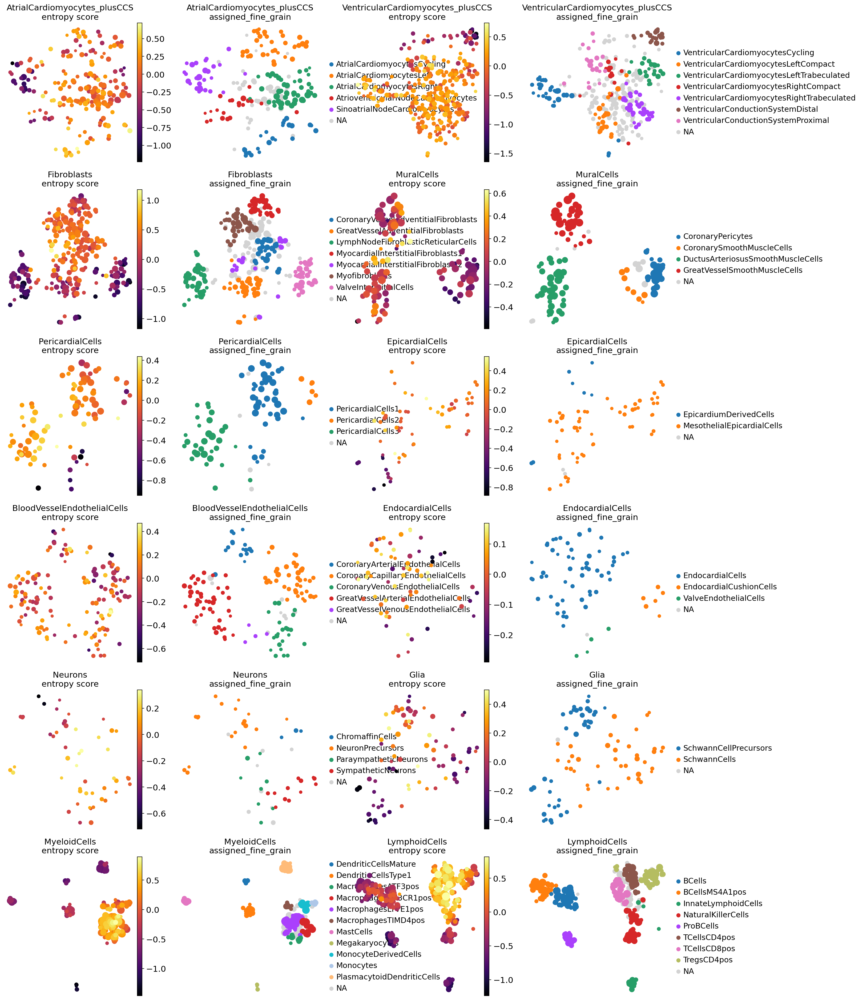

In [40]:
# prepare dictionary to store labels and colors
colors = {}
fig,axs=plt.subplots(nrows=6,ncols=4,figsize=(20,30))
for i,celltype in enumerate(celltypes):
    ad = gex_adata_dict[celltype].uns['nhood_adata']
    ad.obs['nhood'] = [f'{celltype}_nhood_{str(int(x)+1)}' for x in ad.obs.index]
    # add values
    ad.obs[f'assigned_fine_grain'] = list(rna_nhoods_res[celltype]['assigned_fine_grain'].reindex(ad.obs['nhood']))
    ad.obs[f'entropy score'] = list(rna_nhoods_res[celltype]['entropy score, residual'].reindex(ad.obs['nhood']))
    # print(celltype)
    row_pos = i//2
    if i%2==0:
        col_pos_1 = 0
        col_pos_2 = 1
    else:
        col_pos_1 = 2
        col_pos_2 = 3
    sc.pl.embedding(ad,basis='X_milo_graph',size=ad.obs['Nhood_size']*7,
                    color=['entropy score'],
                    cmap='inferno', frameon=False, wspace=0.15, 
                    title=f'{celltype}\nentropy score', show=False,
                    ax=axs[row_pos,col_pos_1]
                   )
    sc.pl.embedding(ad,basis='X_milo_graph',size=ad.obs['Nhood_size']*7,
                    color=['assigned_fine_grain'],
                    cmap='inferno', frameon=False, wspace=0.15, 
                    title=f'{celltype}\nassigned_fine_grain', show=False,
                    ax=axs[row_pos,col_pos_2]
                   )
    # store colors
    colors[celltype]={}
    colors[celltype]['labels'] = list(ad.obs[f'assigned_fine_grain'].cat.categories)
    colors[celltype]['colors'] = ad.uns[f'assigned_fine_grain_colors']
fig.savefig(f"{figdir}/entropyscore_fine-grain-assignment.pdf", bbox_inches="tight",dpi=300)

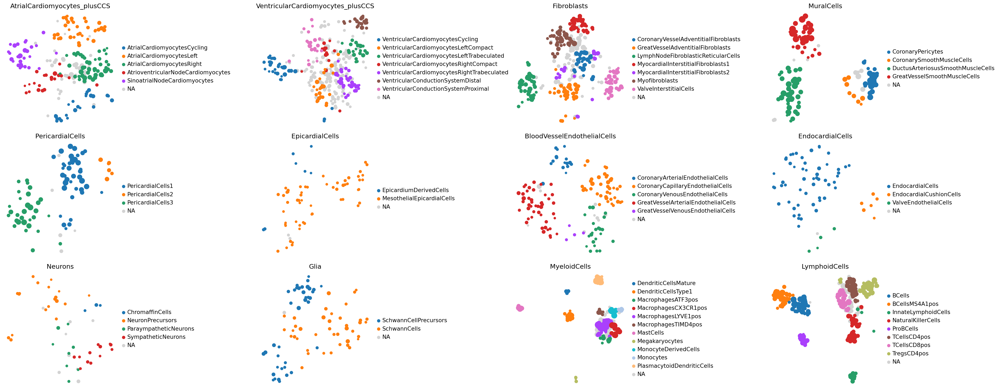

In [28]:
nrows = 3
ncols = 4
fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=(30,12))
for i,celltype in enumerate(celltypes):
    ad = gex_adata_dict[celltype].uns['nhood_adata']
    ad.obs['nhood'] = [f'{celltype}_nhood_{str(int(x)+1)}' for x in ad.obs.index]
    # add fine-grained labels
    ad.obs[celltype] = list(rna_nhoods_res[celltype]['assigned_fine_grain'].reindex(ad.obs['nhood']))
    sc.pl.embedding(ad,basis='X_milo_graph',size=ad.obs['Nhood_size']*7,
                    color=[celltype], # legend_loc='on data', 
                    legend_fontsize=12,
                    cmap='inferno', frameon=False,
                    show=False, ax=axs[i//ncols,i%ncols]
                   )
fig.tight_layout(w_pad=0.2)

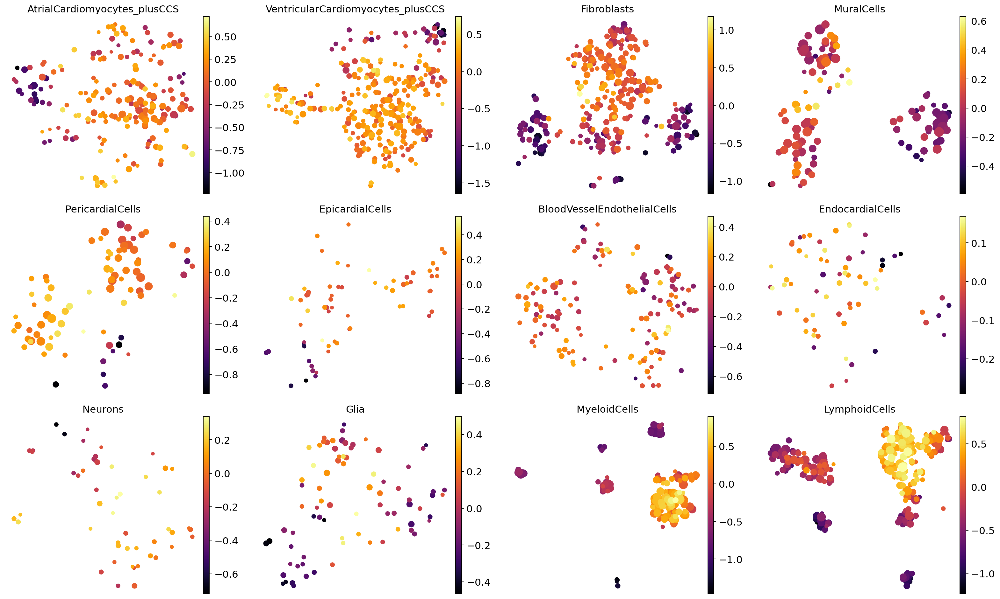

In [29]:
nrows = 3
ncols = 4
fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=(20,12))
for i,celltype in enumerate(celltypes):
    ad = gex_adata_dict[celltype].uns['nhood_adata']
    ad.obs['nhood'] = [f'{celltype}_nhood_{str(int(x)+1)}' for x in ad.obs.index]
    # add entropy scores
    ad.obs[celltype] = list(rna_nhoods_res[celltype]['entropy score, residual'].reindex(ad.obs['nhood']))
    sc.pl.embedding(ad,basis='X_milo_graph',size=ad.obs['Nhood_size']*7,
                    color=[celltype],
                    cmap='inferno', frameon=False,
                    show=False, ax=axs[i//ncols,i%ncols]
                   )
fig.tight_layout()

# Plot entropy scores per cell type

## All mid-grained cell types

/tmp/ipykernel_60954/2274242884.py:10: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  nhoods_res_concat['mid_grain_mod'].cat.reorder_categories(celltypes,inplace=True)


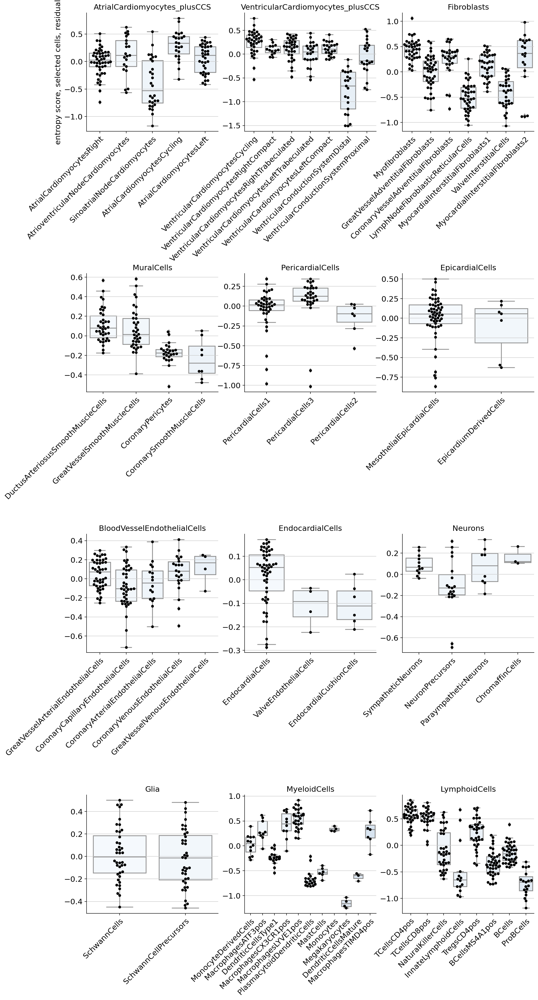

In [30]:
# Prepare concatenated dataframe
for i,celltype in enumerate(celltypes):
    subset = rna_nhoods_res[celltype].copy()
    subset['mid_grain_mod'] = celltype
    if i==0:
        nhoods_res_concat = subset.copy()
    else:
        nhoods_res_concat = pd.concat([nhoods_res_concat,subset])
nhoods_res_concat['mid_grain_mod']=nhoods_res_concat['mid_grain_mod'].astype('category')
nhoods_res_concat['mid_grain_mod'].cat.reorder_categories(celltypes,inplace=True)
nhoods_res_concat=nhoods_res_concat.dropna(subset='assigned_fine_grain')

# Create a catplot with boxplots for each gene
g = sns.catplot(x='assigned_fine_grain', y='entropy score, selected cells, residual', col='mid_grain_mod', data=nhoods_res_concat, kind='box',
                col_wrap=3, sharey=False, sharex=False, height=6, aspect=0.8, palette="Blues")

# Overlay swarmplot on each Axes
# We'll use the 'hue' parameter to match the subsets and turn off dodge to align the points with the boxes.
for celltype, ax in zip(celltypes, g.axes.flat):
    subset = nhoods_res_concat[nhoods_res_concat['mid_grain_mod'] == celltype]
    sns.swarmplot(x='assigned_fine_grain', y='entropy score, selected cells, residual', data=subset, color='k', size=5, ax=ax, dodge=False)
    
# Update titles to remove " ="
for ax, celltype in zip(g.axes.flat, celltypes):
    ax.set_title(celltype)

# Rotate x-tick labels and remove x-axis labels
for i,ax in enumerate(g.axes.flat):
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")  # Rotate x-tick labels
    # ax.set_xticklabels('')
    ax.set_xlabel('')  # Remove x-axis labels
    if i!=0:
        ax.set_ylabel('')

# Adjust the spacing of the plots
g.fig.subplots_adjust(wspace=0.2, hspace=1.2)

# Show the plot
plt.show()

/tmp/ipykernel_60954/3286563489.py:10: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  nhoods_res_concat['mid_grain_mod'].cat.reorder_categories(celltypes,inplace=True)


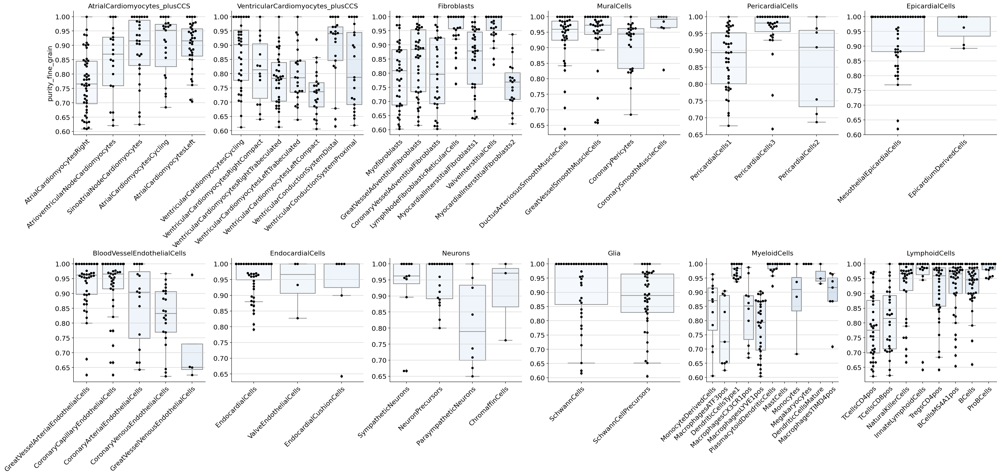

In [31]:
# Prepare concatenated dataframe
for i,celltype in enumerate(celltypes):
    subset = rna_nhoods_res[celltype].copy()
    subset['mid_grain_mod'] = celltype
    if i==0:
        nhoods_res_concat = subset.copy()
    else:
        nhoods_res_concat = pd.concat([nhoods_res_concat,subset])
nhoods_res_concat['mid_grain_mod']=nhoods_res_concat['mid_grain_mod'].astype('category')
nhoods_res_concat['mid_grain_mod'].cat.reorder_categories(celltypes,inplace=True)
nhoods_res_concat=nhoods_res_concat.dropna(subset='assigned_fine_grain')

# Create a catplot with boxplots for each gene
g = sns.catplot(x='assigned_fine_grain', y='purity_fine_grain', col='mid_grain_mod', data=nhoods_res_concat, kind='box',
                col_wrap=6, sharey=False, sharex=False, height=6, aspect=0.8, palette="Blues")

# Overlay swarmplot on each Axes
# We'll use the 'hue' parameter to match the subsets and turn off dodge to align the points with the boxes.
for celltype, ax in zip(celltypes, g.axes.flat):
    subset = nhoods_res_concat[nhoods_res_concat['mid_grain_mod'] == celltype]
    sns.swarmplot(x='assigned_fine_grain', y='purity_fine_grain', data=subset, color='k', size=5, ax=ax, dodge=False)
    
# Update titles to remove " ="
for ax, celltype in zip(g.axes.flat, celltypes):
    ax.set_title(celltype)

# Rotate x-tick labels and remove x-axis labels
for i,ax in enumerate(g.axes.flat):
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")  # Rotate x-tick labels
    # ax.set_xticklabels('')
    ax.set_xlabel('')  # Remove x-axis labels
    if i!=0:
        ax.set_ylabel('')

# Adjust the spacing of the plots
g.fig.subplots_adjust(wspace=0.2, hspace=1)

# Show the plot
plt.show()

# Kruskal-Wallis Test for two groups

* Atrial, working vs conduction system CM
* Ventriclular, working vs conduction system CM
* Myelioid, mono-MP vs others

In [51]:
import scipy.stats as stats
import scikit_posthocs as spost

### Atrial cardiomyocytes

In [54]:
celltype = 'AtrialCardiomyocytes_plusCCS'
assigned = rna_nhoods_res[celltype].copy()
assigned = assigned.dropna(subset='assigned_fine_grain')
set(assigned['assigned_fine_grain'])

{'AtrialCardiomyocytesCycling',
 'AtrialCardiomyocytesLeft',
 'AtrialCardiomyocytesRight',
 'AtrioventricularNodeCardiomyocytes',
 'SinoatrialNodeCardiomyocytes'}

In [55]:
celltype = 'AtrialCardiomyocytes_plusCCS'
map_celltypes = {
    'AtrialCardiomyocytesCycling':'AtrialWorkingCM',
     'AtrialCardiomyocytesLeft':'AtrialWorkingCM',
     'AtrialCardiomyocytesRight':'AtrialWorkingCM',
     'AtrioventricularNodeCardiomyocytes':'AtrialCCS',
     'SinoatrialNodeCardiomyocytes':'AtrialCCS'
}

assigned = rna_nhoods_res[celltype].copy()
assigned = assigned.dropna(subset='assigned_fine_grain')
assigned['mapped_celltype'] = assigned['assigned_fine_grain'].copy()
assigned.replace({'mapped_celltype':map_celltypes},inplace=True)

# Grouping data by SampleLabel
grouped_data = assigned.groupby('mapped_celltype')['entropy score, selected cells, residual'].apply(list)

# Kruskal-Wallis Test
stat, p_value = stats.kruskal(*grouped_data)
print("Kruskal-Wallis Test:")
print(f"Statistic: {stat}, P-value: {p_value}")
print("")

# also confirm with mann-whitney-u test (scipy)
stat, p_value = stats.mannwhitneyu(*grouped_data)
print("Mann-Whitney U rank Test:")
print(f"Statistic: {stat}, P-value: {p_value}")

Kruskal-Wallis Test:
Statistic: 10.054975332593926, P-value: 0.0015193705181662676

Mann-Whitney U rank Test:
Statistic: 1791.0, P-value: 0.0015293858581563156


### Ventricular cardiomyocytes

In [56]:
celltype = 'VentricularCardiomyocytes_plusCCS'
assigned = rna_nhoods_res[celltype].copy()
assigned = assigned.dropna(subset='assigned_fine_grain')
set(assigned['assigned_fine_grain'])

{'VentricularCardiomyocytesCycling',
 'VentricularCardiomyocytesLeftCompact',
 'VentricularCardiomyocytesLeftTrabeculated',
 'VentricularCardiomyocytesRightCompact',
 'VentricularCardiomyocytesRightTrabeculated',
 'VentricularConductionSystemDistal',
 'VentricularConductionSystemProximal'}

In [57]:
celltype = 'VentricularCardiomyocytes_plusCCS'
map_celltypes = {
    'VentricularCardiomyocytesCycling':'VentricularWorkingCM',
     'VentricularCardiomyocytesLeftCompact':'VentricularWorkingCM',
     'VentricularCardiomyocytesLeftTrabeculated':'VentricularWorkingCM',
     'VentricularCardiomyocytesRightCompact':'VentricularWorkingCM',
     'VentricularCardiomyocytesRightTrabeculated':'VentricularWorkingCM',
     'VentricularConductionSystemDistal':'VentricularCCS',
     'VentricularConductionSystemProximal':'VentricularCCS'
}

assigned = rna_nhoods_res[celltype].copy()
assigned = assigned.dropna(subset='assigned_fine_grain')
assigned['mapped_celltype'] = assigned['assigned_fine_grain'].copy()
assigned.replace({'mapped_celltype':map_celltypes},inplace=True)

# Grouping data by SampleLabel
grouped_data = assigned.groupby('mapped_celltype')['entropy score, selected cells, residual'].apply(list)

# Kruskal-Wallis Test
stat, p_value = stats.kruskal(*grouped_data)
print("Kruskal-Wallis Test:")
print(f"Statistic: {stat}, P-value: {p_value}")
print("")

# also confirm with mann-whitney-u test (scipy)
stat, p_value = stats.mannwhitneyu(*grouped_data)
print("Mann-Whitney U rank Test:")
print(f"Statistic: {stat}, P-value: {p_value}")

Kruskal-Wallis Test:
Statistic: 39.17342310868321, P-value: 3.877830158632655e-10

Mann-Whitney U rank Test:
Statistic: 974.0, P-value: 3.922386003787531e-10


### Myeloid cells

In [58]:
celltype = 'MyeloidCells'
assigned = rna_nhoods_res[celltype].copy()
assigned = assigned.dropna(subset='assigned_fine_grain')
set(assigned['assigned_fine_grain'])

{'DendriticCellsMature',
 'DendriticCellsType1',
 'MacrophagesATF3pos',
 'MacrophagesCX3CR1pos',
 'MacrophagesLYVE1pos',
 'MacrophagesTIMD4pos',
 'MastCells',
 'Megakaryocytes',
 'MonocyteDerivedCells',
 'Monocytes',
 'PlasmacytoidDendriticCells'}

In [59]:
celltype = 'MyeloidCells'
map_celltypes = {
    'Monocytes':'Mo,MP',
    'MonocyteDerivedCells':'Mo,MP',
    'MacrophagesCX3CR1pos':'Mo,MP',
    'MacrophagesLYVE1pos':'Mo,MP',
    'MacrophagesTIMD4pos':'Mo,MP',
    'MacrophagesATF3pos':'Mo,MP',
    'DendriticCellsType1':'DC',
    'DendriticCellsMature':'DC',
    'PlasmacytoidDendriticCells':'DC',
     'MastCells':'Mast',
     'Megakaryocytes':'Mega',
}

assigned = rna_nhoods_res[celltype].copy()
assigned = assigned.dropna(subset='assigned_fine_grain')
assigned['mapped_celltype'] = assigned['assigned_fine_grain'].copy()
assigned.replace({'mapped_celltype':map_celltypes},inplace=True)

# Grouping data by SampleLabel
grouped_data = assigned.groupby('mapped_celltype')['entropy score, selected cells, residual'].apply(list)

# Kruskal-Wallis Test
stat, p_value = stats.kruskal(*grouped_data)
print("Kruskal-Wallis Test:")
print(f"Statistic: {stat}, P-value: {p_value}")

# Perform Post Hoc analysis if Kruskal-Wallis test is significant
if p_value < 0.05:
    print("\nPerforming Post Hoc Analysis with Dunn's test...")

    # Post Hoc analysis using scikit-posthocs
    posthoc_results = spost.posthoc_dunn(assigned, 
                                         val_col='entropy score, selected cells, residual', 
                                         group_col='mapped_celltype', 
                                         p_adjust='bonferroni')

    # Print results
    print("Post Hoc Analysis (Dunn's test with Bonferroni correction):")
    display(pd.DataFrame(posthoc_results))
else:
    print("No significant differences found. No need for Post Hoc analysis.")

Kruskal-Wallis Test:
Statistic: 89.22165969298436, P-value: 3.219039117656211e-19

Performing Post Hoc Analysis with Dunn's test...
Post Hoc Analysis (Dunn's test with Bonferroni correction):


,DC,Mast,Mega,"Mo,MP"
DC,1.000000e+00,1.00000,0.871586,2.371086e-16
Mast,1.000000e+00,1.00000,1.000000,3.798404e-04
Mega,8.715855e-01,1.00000,1.000000,2.167294e-05
"Mo,MP",2.371086e-16,0.00038,0.000022,1.000000e+00


#　For figure plots

### UMAPs

In [23]:
celltypes

['AtrialCardiomyocytes_plusCCS',
 'VentricularCardiomyocytes_plusCCS',
 'Fibroblasts',
 'MuralCells',
 'PericardialCells',
 'EpicardialCells',
 'BloodVesselEndothelialCells',
 'EndocardialCells',
 'Neurons',
 'Glia',
 'MyeloidCells',
 'LymphoidCells']

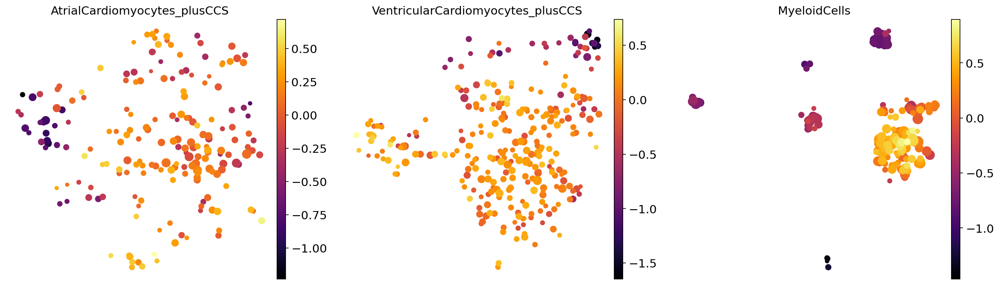

In [31]:
cells_to_plot = ['AtrialCardiomyocytes_plusCCS','VentricularCardiomyocytes_plusCCS','MyeloidCells']

nrows = 1
ncols = 3
fig,axs=plt.subplots(nrows=nrows,ncols=ncols,figsize=(17,5))
for i,celltype in enumerate(cells_to_plot):
    ad = gex_adata_dict[celltype].uns['nhood_adata']
    ad.obs['nhood'] = [f'{celltype}_nhood_{str(int(x)+1)}' for x in ad.obs.index]
    # add entropy scores
    ad.obs[celltype] = list(rna_nhoods_res[celltype]['entropy score, residual'].reindex(ad.obs['nhood']))
    sc.pl.embedding(ad,basis='X_milo_graph',size=ad.obs['Nhood_size']*7,
                    color=[celltype],
                    cmap='inferno', frameon=False,
                    show=False, ax=axs[i]
                   )
fig.tight_layout()
fig.savefig(f"{figdir}/entropyscore_UMAPs_for-main.pdf",bbox_inches="tight",dpi=300)

### Bar plots

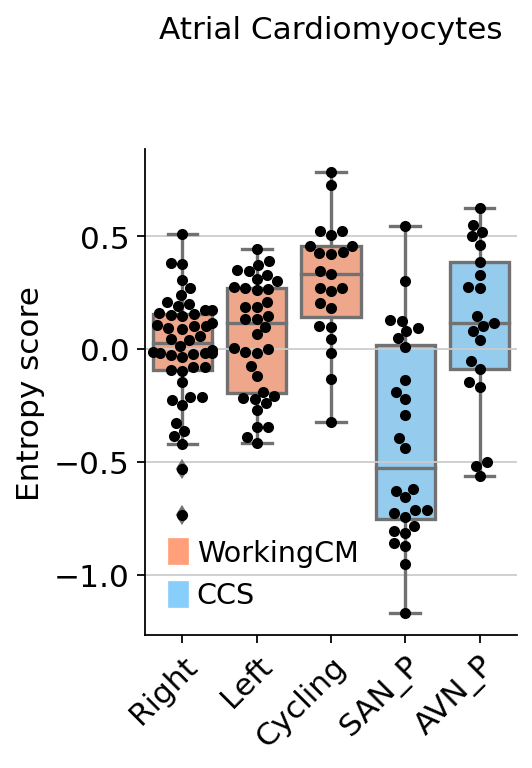

In [20]:
celltype = 'AtrialCardiomyocytes_plusCCS'
relabel = {
    'AtrialCardiomyocytesRight':'Right',
    'AtrialCardiomyocytesLeft':'Left',
    'AtrialCardiomyocytesCycling':'Cycling',
    'SinoatrialNodeCardiomyocytes':'SAN_P',
     'AtrioventricularNodeCardiomyocytes':'AVN_P',
}
map_celltypes = {
    'AtrialCardiomyocytesRight':'WorkingCM',
    'AtrialCardiomyocytesLeft':'WorkingCM',
    'AtrialCardiomyocytesCycling':'WorkingCM',
    'SinoatrialNodeCardiomyocytes':'CCS',
     'AtrioventricularNodeCardiomyocytes':'CCS',
}
map_colors = {
    'WorkingCM':'lightsalmon',
     'CCS':'lightskyblue',
}

assigned = rna_nhoods_res[celltype].copy()
assigned = assigned.dropna(subset='assigned_fine_grain')
assigned['mapped_celltype'] = assigned['assigned_fine_grain'].copy()
assigned.replace({'mapped_celltype':map_celltypes},inplace=True)
assigned['relabeled'] = assigned['assigned_fine_grain'].copy()
assigned.replace({'relabeled':relabel},inplace=True)
assigned['relabeled'] = pd.Categorical(assigned['relabeled'],
                                              categories=relabel.values(),
                                              ordered=True)

# Create a catplot with boxplots
g = sns.catplot(x='relabeled', y='entropy score, selected cells, residual', 
                col=None, data=assigned, kind='box',
                col_wrap=None, sharey=False, sharex=False, height=4, aspect=0.9, 
                palette=[map_colors[x] for x in map_celltypes.values()],
               )
sns.swarmplot(x='relabeled', y='entropy score, selected cells, residual', 
              data=assigned, color='k', size=5,dodge=False)

# Create a list of patches for the legend
patches = [mpatches.Patch(color=color, label=label, linewidth=3) for label, color in map_colors.items()]
# Add legend to the plot
plt.legend(handles=patches, frameon=False)
plt.title('Atrial Cardiomyocytes', pad=50)
plt.xticks(rotation=45, ha="right", rotation_mode="anchor")  # Rotate x-tick labels
plt.xlabel('') # Remove x-axis labels
plt.ylabel('Entropy score')
plt.savefig(f"{figdir}/entropyscore_barplot_{celltype}.pdf", bbox_inches="tight",dpi=300)
plt.show()

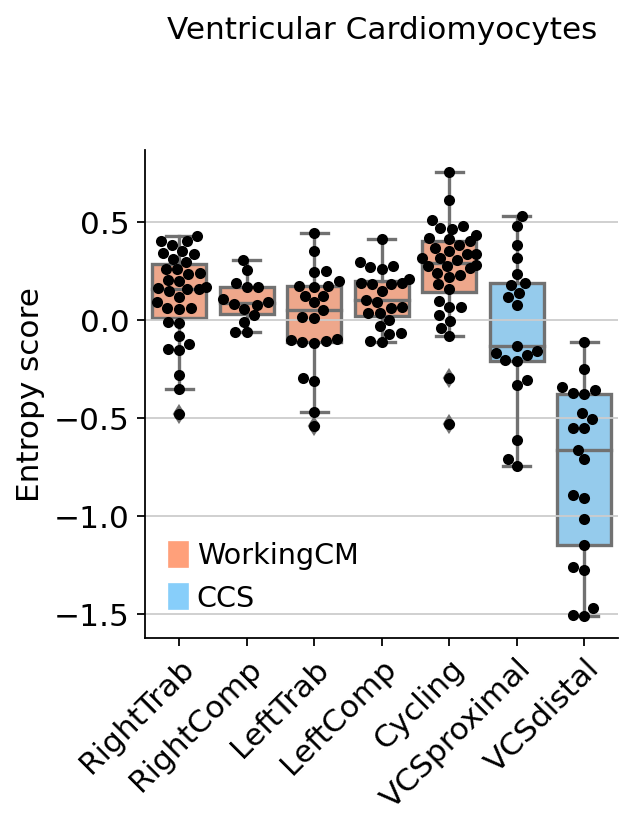

In [21]:
celltype = 'VentricularCardiomyocytes_plusCCS'
relabel = {
    'VentricularCardiomyocytesRightTrabeculated':'RightTrab',
    'VentricularCardiomyocytesRightCompact':'RightComp',
    'VentricularCardiomyocytesLeftTrabeculated':'LeftTrab',
    'VentricularCardiomyocytesLeftCompact':'LeftComp',
    'VentricularCardiomyocytesCycling':'Cycling',
   'VentricularConductionSystemProximal':'VCSproximal',
     'VentricularConductionSystemDistal':'VCSdistal',
}
map_celltypes = {
    'VentricularCardiomyocytesRightTrabeculated':'WorkingCM',
    'VentricularCardiomyocytesRightCompact':'WorkingCM',
    'VentricularCardiomyocytesLeftTrabeculated':'WorkingCM',
    'VentricularCardiomyocytesLeftCompact':'WorkingCM',
    'VentricularCardiomyocytesCycling':'WorkingCM',
   'VentricularConductionSystemProximal':'CCS',
     'VentricularConductionSystemDistal':'CCS',
}
map_colors = {
    'WorkingCM':'lightsalmon',
     'CCS':'lightskyblue',
}

assigned = rna_nhoods_res[celltype].copy()
assigned = assigned.dropna(subset='assigned_fine_grain')
assigned['mapped_celltype'] = assigned['assigned_fine_grain'].copy()
assigned.replace({'mapped_celltype':map_celltypes},inplace=True)
assigned['relabeled'] = assigned['assigned_fine_grain'].copy()
assigned.replace({'relabeled':relabel},inplace=True)
assigned['relabeled'] = pd.Categorical(assigned['relabeled'],
                                              categories=relabel.values(),
                                              ordered=True)

# Create a catplot with boxplots
g = sns.catplot(x='relabeled', y='entropy score, selected cells, residual', 
                col=None, data=assigned, kind='box',
                col_wrap=None, sharey=False, sharex=False, height=4, aspect=1.1, 
                palette=[map_colors[x] for x in map_celltypes.values()],
               )
sns.swarmplot(x='relabeled', y='entropy score, selected cells, residual', 
              data=assigned, color='k', size=5,dodge=False)

# Create a list of patches for the legend
patches = [mpatches.Patch(color=color, label=label, linewidth=3) for label, color in map_colors.items()]
# Add legend to the plot
plt.legend(handles=patches, frameon=False)
plt.title('Ventricular Cardiomyocytes', pad=50)
plt.xticks(rotation=45, ha="right", rotation_mode="anchor")  # Rotate x-tick labels
plt.xlabel('') # Remove x-axis labels
plt.ylabel('Entropy score')
plt.savefig(f"{figdir}/entropyscore_barplot_{celltype}.pdf", bbox_inches="tight",dpi=300)
plt.show()

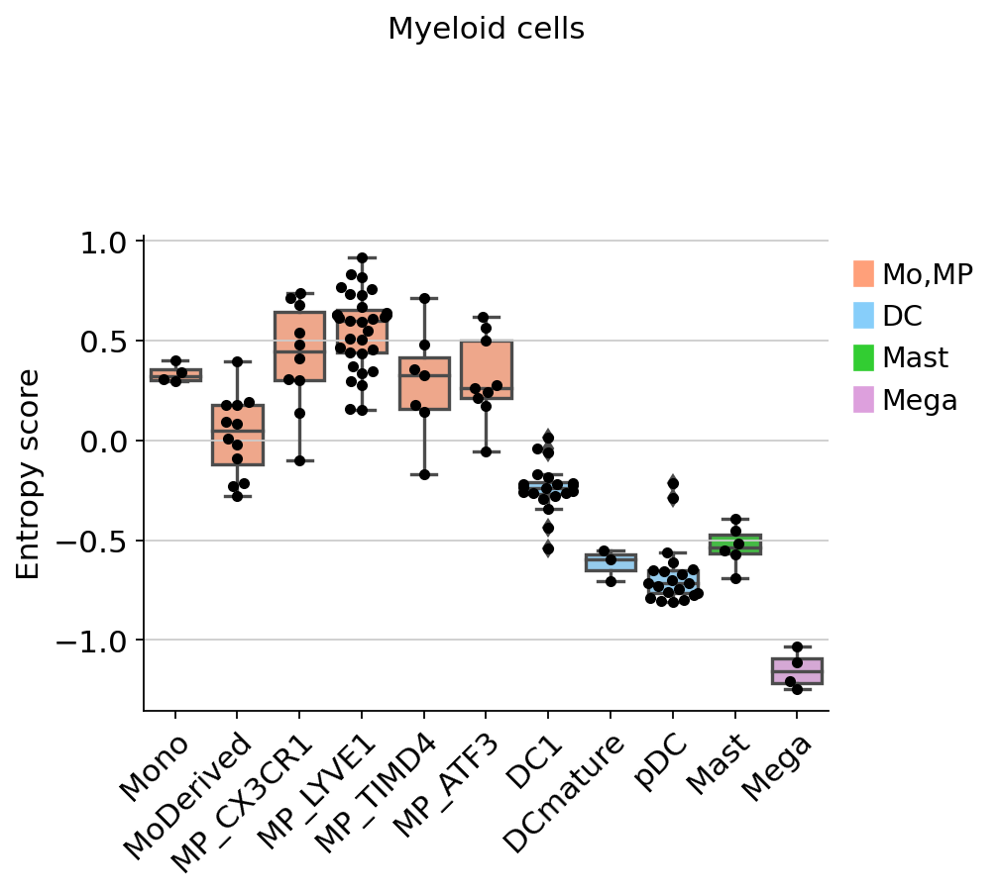

In [22]:
celltype = 'MyeloidCells'
relabel = {
    'Monocytes':'Mono',
    'MonocyteDerivedCells':'MoDerived',
    'MacrophagesCX3CR1pos':'MP_CX3CR1',
    'MacrophagesLYVE1pos':'MP_LYVE1',
    'MacrophagesTIMD4pos':'MP_TIMD4',
    'MacrophagesATF3pos':'MP_ATF3',
    'DendriticCellsType1':'DC1',
    'DendriticCellsMature':'DCmature',
    'PlasmacytoidDendriticCells':'pDC',
     'MastCells':'Mast',
     'Megakaryocytes':'Mega',
}
map_celltypes = {
    'Monocytes':'Mo,MP',
    'MonocyteDerivedCells':'Mo,MP',
    'MacrophagesCX3CR1pos':'Mo,MP',
    'MacrophagesLYVE1pos':'Mo,MP',
    'MacrophagesTIMD4pos':'Mo,MP',
    'MacrophagesATF3pos':'Mo,MP',
    'DendriticCellsType1':'DC',
    'DendriticCellsMature':'DC',
    'PlasmacytoidDendriticCells':'DC',
     'MastCells':'Mast',
     'Megakaryocytes':'Mega',
}
map_colors = {
    'Mo,MP':'lightsalmon',
     'DC':'lightskyblue',
    'Mast':'limegreen',
    'Mega':'plum',
}

assigned = rna_nhoods_res[celltype].copy()
assigned = assigned.dropna(subset='assigned_fine_grain')
assigned['mapped_celltype'] = assigned['assigned_fine_grain'].copy()
assigned.replace({'mapped_celltype':map_celltypes},inplace=True)
assigned['relabeled'] = assigned['assigned_fine_grain'].copy()
assigned.replace({'relabeled':relabel},inplace=True)
assigned['relabeled'] = pd.Categorical(assigned['relabeled'],
                                              categories=relabel.values(),
                                              ordered=True)

# Create a catplot with boxplots
g = sns.catplot(x='relabeled', y='entropy score, selected cells, residual', 
                col=None, data=assigned, kind='box',
                col_wrap=None, sharey=False, sharex=False, height=4, aspect=1.4, 
                palette=[map_colors[x] for x in map_celltypes.values()],
               )
sns.swarmplot(x='relabeled', y='entropy score, selected cells, residual', 
              data=assigned, color='k', size=5,dodge=False)

# Create a list of patches for the legend
patches = [mpatches.Patch(color=color, label=label, linewidth=3) for label, color in map_colors.items()]
# Add legend to the plot
plt.legend(handles=patches, frameon=False, bbox_to_anchor=(1.25, 1))
plt.title('Myeloid cells', pad=90)
plt.xticks(rotation=45, ha="right", rotation_mode="anchor")  # Rotate x-tick labels
plt.xlabel('') # Remove x-axis labels
plt.ylabel('Entropy score')
plt.savefig(f"{figdir}/entropyscore_barplot_{celltype}.pdf", bbox_inches="tight",dpi=300)
plt.show()